In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.axes import Axes
from scipy import signal
from scipy.io import wavfile as wav
import IPython.display as ipd
import statistics as stats
import soundfile as sf
import sys
import os

# Allows me to import my modules
sys.path.append('./modules')

# The python definition of f(x) for problem 1.
from audio_utils import *

Attempting to read settings file...
	Read successfully!


In [2]:
data = read_data("raw", batch_size=5)

In [3]:
def plot(title, samples, sample_rate, ylim=None):
    # Plot the signal read from wav file
    
    plt.subplot(211)

    plt.title(title)

    a = plt.plot(samples)
    
    plt.xlabel('Sample')

    plt.ylabel('Amplitude')

    plt.subplot(212)

    plt.specgram(samples, Fs=sample_rate)
    
    plt.ylim((0, int(sample_rate / 2)) if ylim is None else ylim)

    plt.xlabel('Time')

    plt.ylabel('Frequency')

    plt.show()

In [4]:
kit_label_count = {kl: 0 for kl in SETTINGS.label["kit_label"]}
for d in data:
    label = d.labels["kit_label"]
    kit_label_count[label] += 1
    # Changes the Frequency (y-limits) to between 0 and 30000
    plot(title=label+str(kit_label_count[label]), samples=d.data, sample_rate=d.rate, ylim=(0, 30000))

TypeError: unhashable type: 'list'

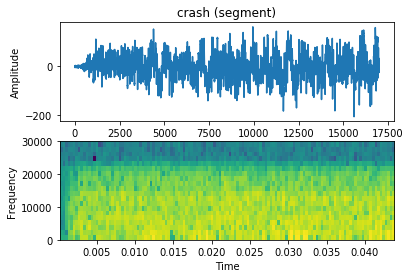

In [4]:
plot("crash (segment)", data[1].data[983000:1000000], data[1].rate, (0, 30000))

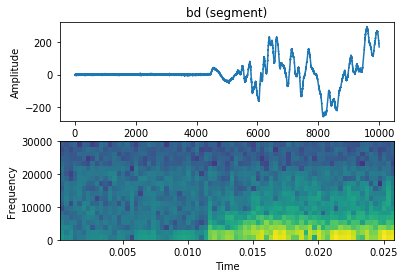

In [6]:
plot("bd (segment)", data[0].data[2015000:2025000], data[0].rate, (0, 30000))

In [7]:
resampled_bd = reduce_sample_rate(data[0], 1000)

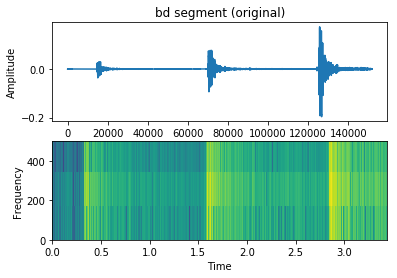

In [8]:
plot("bd segment (original)", data[0].data, data[0].rate, ylim=(0, 500))

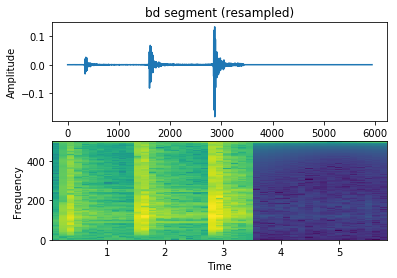

In [9]:
plot("bd segment (resampled)", resampled_bd.data, resampled_bd.rate, ylim=(0, 500))

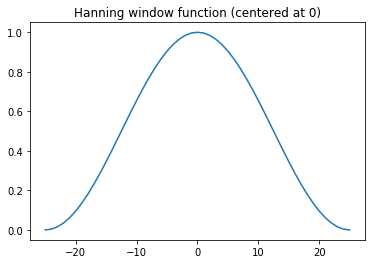

In [10]:
# Energy based novelty
w = np.array(signal.hann(51))
xs = np.array([i for i in range(-25, 26)])
plt.plot(xs, w)
plt.title("Hanning window function (centered at 0)")
plt.show()

{'hit_label': ['beater'], 'kit_label': ['bass_drum'], 'tech_label': ['normal']}


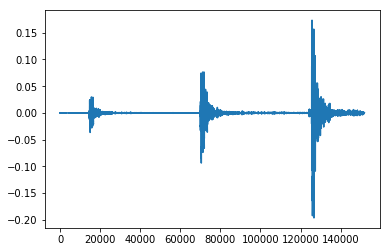

In [11]:
print(data[0].labels)
plt.plot(data[0].data)
plt.show()
ipd.Audio(data[0].data, rate=data[0].rate)

In [20]:
reduced_d0 = reduce_sample_rate(data[1], 3000)

{'hit_label': ['beater'], 'kit_label': ['bass_drum'], 'tech_label': ['normal']}


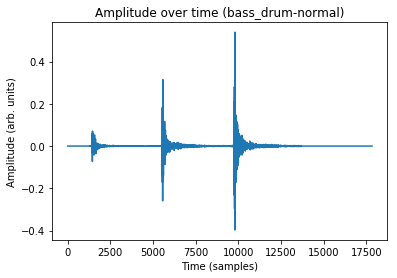

In [35]:
print(reduced_d0.labels)
plt.plot(reduced_d0.data)
plt.title("Amplitude over time ({}-{})".format(reduced_d0.labels["kit_label"][0], reduced_d0.labels["tech_label"][0]))
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude (arb. units)")
plt.show()
ipd.Audio(reduced_d0.data, rate=3000)

In [21]:
start_time = time.time()
bd_local_energy = local_energy_func(reduced_d0.data, 100)
end_time = time.time()
print(round(end_time-start_time, 3))

5.614


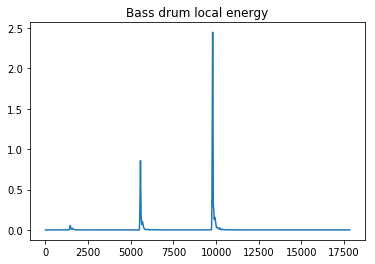

In [22]:
plt.plot(bd_local_energy)
plt.title("Bass drum local energy")
plt.show()

In [23]:
start_time = time.time()
bd_ebn = energy_based_novelty(reduced_d0.data, 100)
end_time = time.time()
print(round(end_time-start_time, 3))

5.77


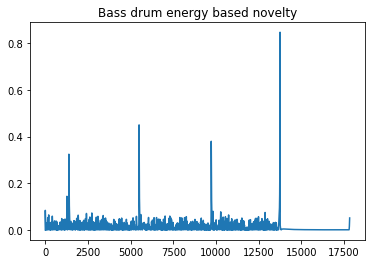

In [24]:
plt.plot(bd_ebn)
plt.title("Bass drum energy based novelty")
plt.show()

In [25]:
bd_ebn_sd = stats.stdev(bd_ebn.tolist())

In [26]:
start_time = time.time()
bd_ebn_tf = threshold_func(bd_ebn, 300, bd_ebn_sd, 5)
end_time = time.time()
print(round(end_time-start_time, 3))

0.603


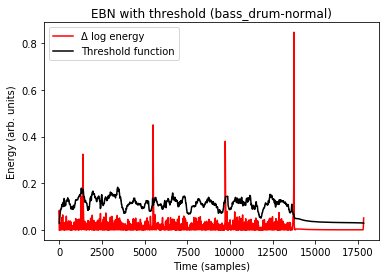

In [30]:
plt.plot(bd_ebn, color="red")
plt.plot(bd_ebn_tf, color="black")
plt.legend(["Δ log energy", "Threshold function"])
plt.title("EBN with threshold ({}-{})".format(reduced_d0.labels["kit_label"][0], reduced_d0.labels["tech_label"][0]))
plt.ylabel("Energy (arb. units)")
plt.xlabel("Time (samples)")
plt.show()

In [36]:
onset_detection(bd_ebn, bd_ebn_tf, trim=100)

array([ 1382,  5494,  9722, 13753])

In [15]:
ipd.Audio(reduced_d0.data[57854:], rate=3000)

In [19]:
def save_figure(title, samples, sample_rate):
    # Plot the signal read from wav file
    plt.subplot(2, 1, 1)

    plt.title(title)

    plt.plot(samples)
    
    plt.xlabel('Sample')

    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)

    plt.specgram(samples, Fs=sample_rate)
    
    plt.ylim((0, 30000))

    plt.xlabel('Time')

    plt.ylabel('Frequency')

    plt.savefig(title+".pdf")
    
    plt.close()

In [21]:
sample_data = read_data("raw", batch_size=20)
for s_data in sample_data:
    print("Kit label:", s_data.labels["kit_label"])

Kit label: ['bass_drum']
Kit label: ['crash']
Kit label: ['high_tom']
Kit label: ['hi_hat']
Kit label: ['hi_hat']
Kit label: ['low_tom']
Kit label: ['mid_tom']
Kit label: ['ride']
Kit label: ['ride']
Kit label: ['snare']
Kit label: ['snare']
Kit label: ['snare']
Kit label: ['snare']
Kit label: ['snare']
Kit label: ['splash']
Kit label: ['bass_drum']
Kit label: ['crash']
Kit label: ['high_tom']
Kit label: ['hi_hat']
Kit label: ['low_tom']


In [22]:
data_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 14]
resampled_data = [reduce_sample_rate(sample_data[i], SETTINGS.data["cropped"]["down_sampling_rate"]) for i in data_indices]
cs_resampled = resampled_data[0]
ht_resampled = resampled_data[1]
hhc_resampled = resampled_data[2]
hho_resampled = resampled_data[3]
lt_resampled = resampled_data[4]
mt_resampled = resampled_data[5]
rs_resampled = resampled_data[6]
rsb_resampled = resampled_data[7]
s_resampled = resampled_data[8]
ss_resampled = resampled_data[9]


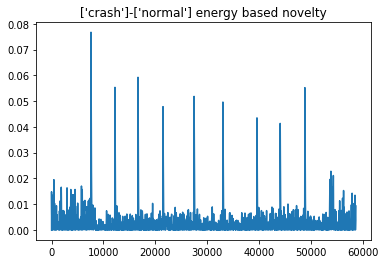

SD: 0.006 	Mean: 0.004 
Execution time:  63.056


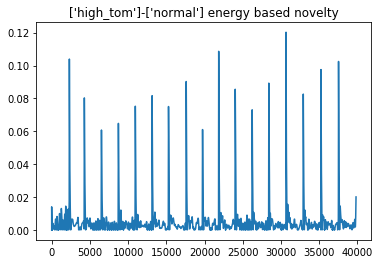

SD: 0.011 	Mean: 0.006 
Execution time:  42.469


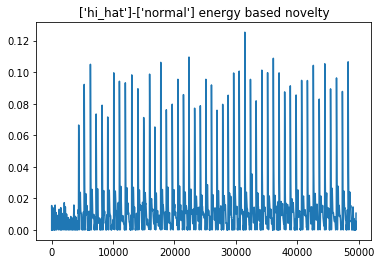

SD: 0.017 	Mean: 0.014 
Execution time:  52.644


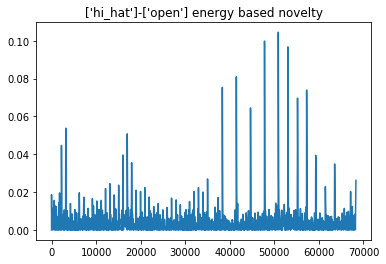

SD: 0.007 	Mean: 0.005 
Execution time:  73.063


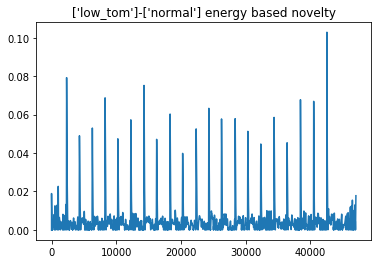

SD: 0.009 	Mean: 0.005 
Execution time:  50.323


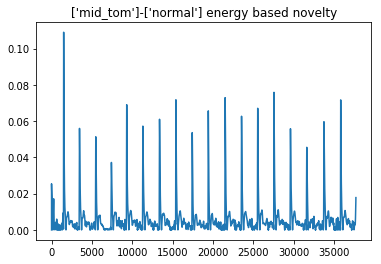

SD: 0.01 	Mean: 0.006 
Execution time:  40.507


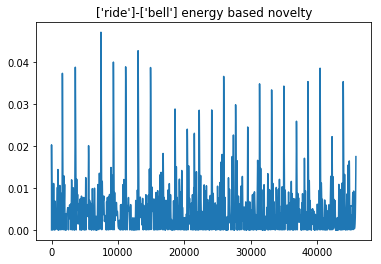

SD: 0.006 	Mean: 0.006 
Execution time:  48.82


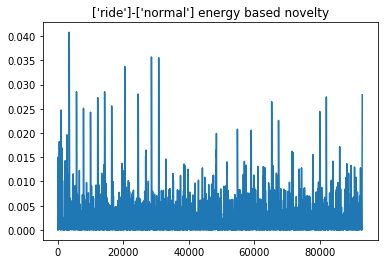

SD: 0.004 	Mean: 0.004 
Execution time:  99.517


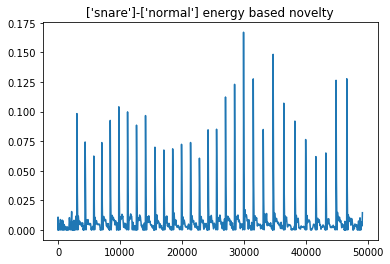

SD: 0.014 	Mean: 0.008 
Execution time:  52.492


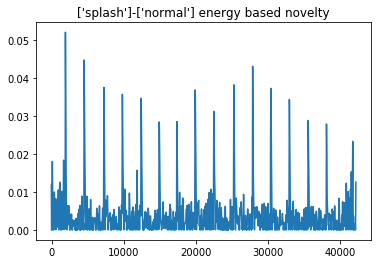

SD: 0.006 	Mean: 0.004 
Execution time:  45.493


In [24]:
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 300)
    end_time = time.time()
    plt.plot(rd_ebn)
    plt.title("{}-{} energy based novelty".format(rd.labels["kit_label"], rd.labels["tech_label"]))
    plt.show()
    print("SD:", round(stats.stdev(rd_ebn.tolist()), 3), "\tMean:", round(np.average(rd_ebn), 3), "\nExecution time: ", round(end_time-start_time, 3))

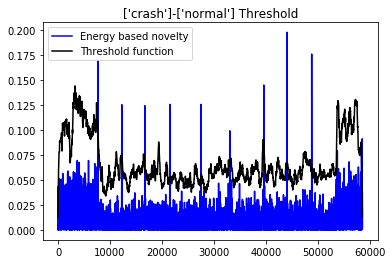

Execution time: 24.446


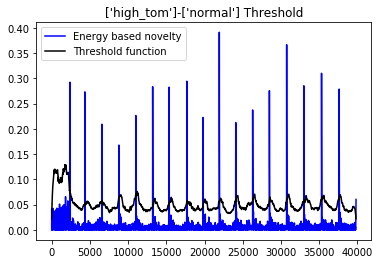

Execution time: 16.513


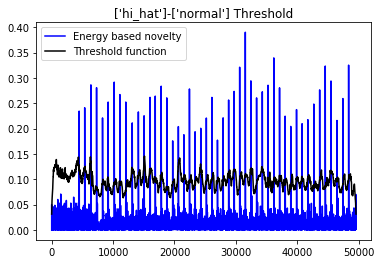

Execution time: 20.776


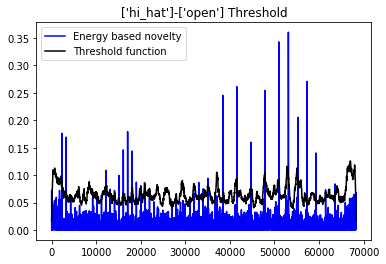

Execution time: 29.172


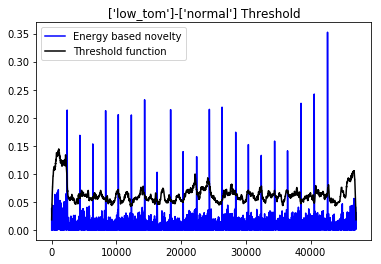

Execution time: 20.303


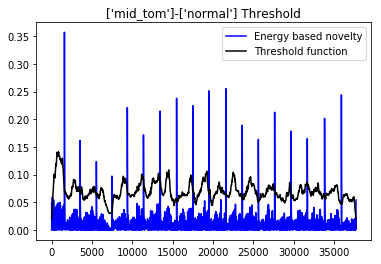

Execution time: 16.163


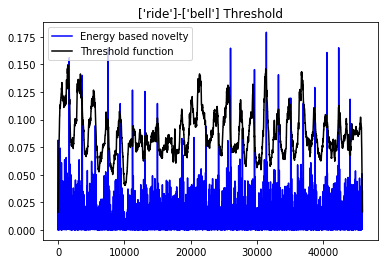

Execution time: 19.636


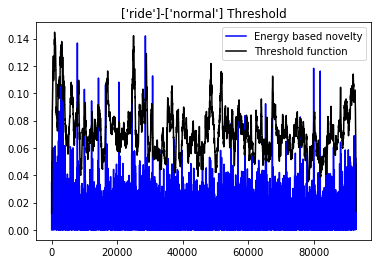

Execution time: 39.753


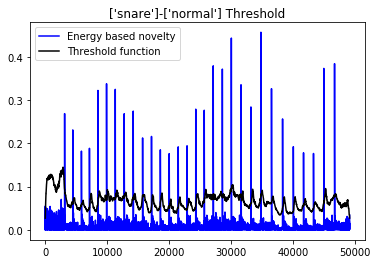

Execution time: 20.436


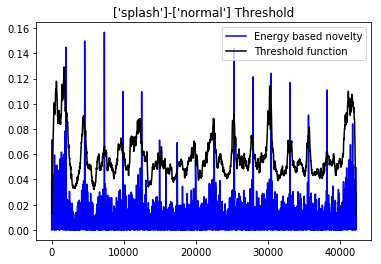

Execution time: 17.736


In [27]:
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 100)
    rd_ebn_tf = threshold_func(rd_ebn, int(SETTINGS.data["cropped"]["down_sampling_rate"]/5), stats.stdev(rd_ebn.tolist()), 5)
    end_time = time.time()
    plt.plot(rd_ebn, color="blue")
    plt.plot(rd_ebn_tf, color="black")
    plt.legend(["Energy based novelty", "Threshold function"])
    plt.title("{}-{} Threshold".format(rd.labels["kit_label"], rd.labels["tech_label"]))
    plt.show()
    print("Execution time:", round(end_time-start_time, 3))

In [28]:
rd_onsets_c1_1sd = []
rd_onsets_c1_2sd = []
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 100)
    rd_ebn_tf = threshold_func(rd_ebn, int(SETTINGS.data["cropped"]["down_sampling_rate"]/5), stats.stdev(rd_ebn.tolist()), 5)
    rd_onsets_c1_1sd.append(onset_detection(rd_ebn, rd_ebn_tf))
    rd_ebn_tf = threshold_func(rd_ebn, int(SETTINGS.data["cropped"]["down_sampling_rate"]/5), 2*stats.stdev(rd_ebn.tolist()), 5)
    rd_onsets_c1_2sd.append(onset_detection(rd_ebn, rd_ebn_tf))
    end_time = time.time()
    print("Execution time:", round(end_time - start_time, 3))

Execution time: 28.243
Execution time: 18.667
Execution time: 23.375
Execution time: 32.035
Execution time: 22.282
Execution time: 17.705
Execution time: 21.672
Execution time: 43.801
Execution time: 23.761
Execution time: 20.837


In [38]:
for onset_i in range(len(resampled_data)):
    print(resampled_data[onset_i].labels["tech_label"][0] + " " + resampled_data[onset_i].labels["kit_label"][0], "\t\t", len(rd_onsets_c1_1sd[onset_i]), len(rd_onsets_c1_2sd[onset_i]))

normal crash 		 10 10
normal high_tom 		 17 17
normal hi_hat 		 47 47
open hi_hat 		 29 21
normal low_tom 		 21 21
normal mid_tom 		 17 17
bell ride 		 17 13
normal ride 		 21 14
normal snare 		 30 30
normal splash 		 14 13


[ 980224 1571200 2139776 2755072 3521024 4230400 4232192 5070464 5641472
 6251776]


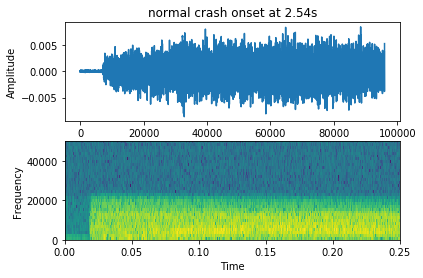

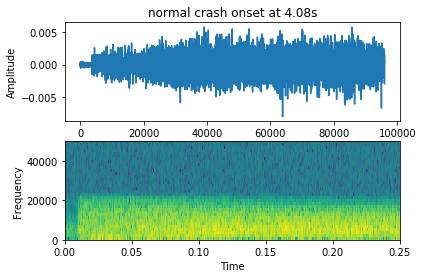

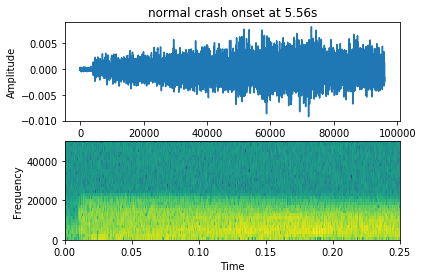

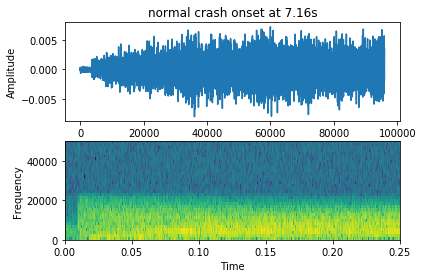

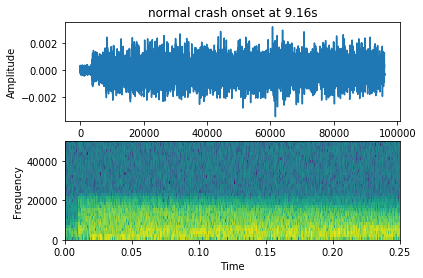

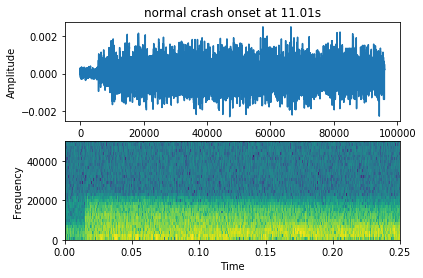

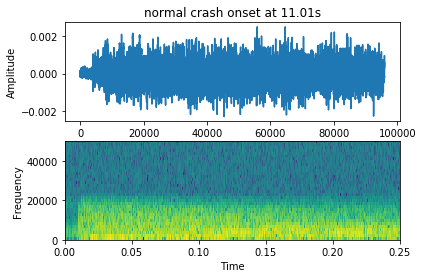

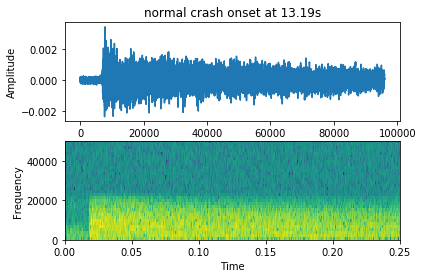

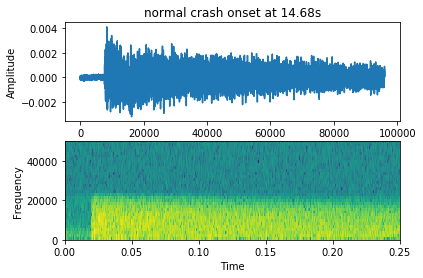

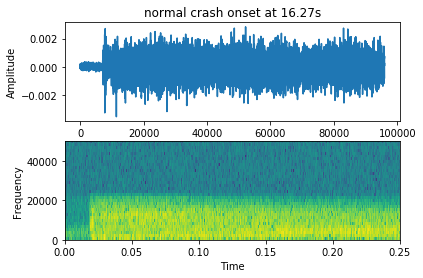

[ 306944  556160  841472 1125632 1409920 1691648 1966080 2263424 2535552
 2807936 3083392 3366528 3646976 3936128 4223872 4520448 4815488]


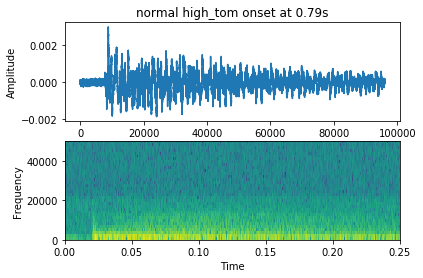

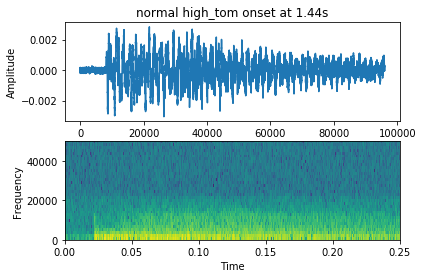

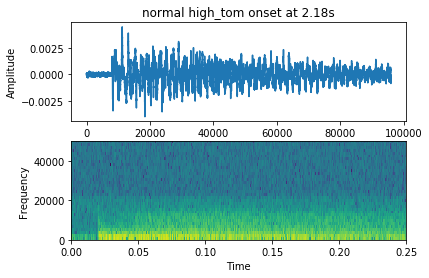

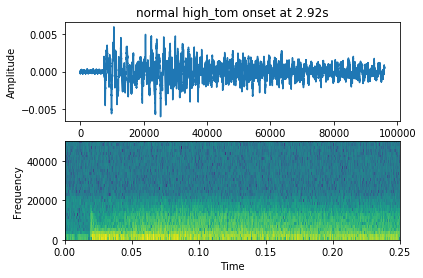

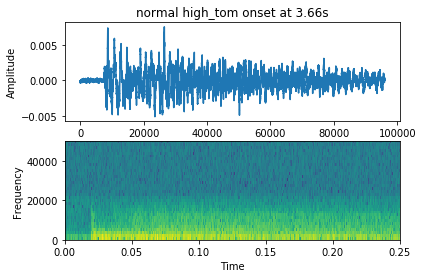

...

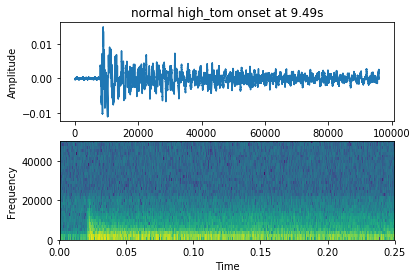

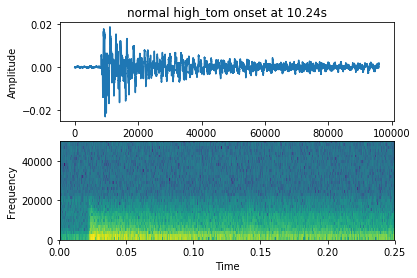

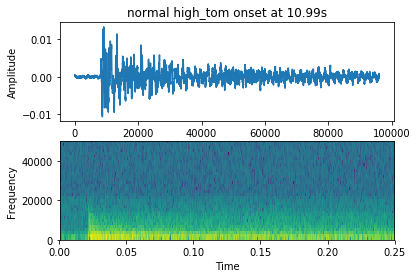

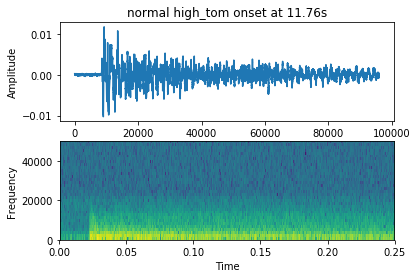

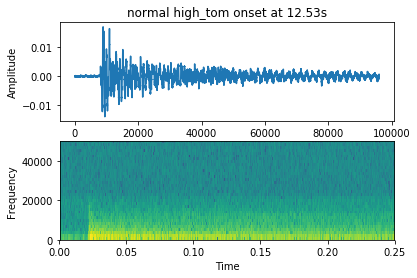

[ 572416  688512  817536  935680 1060096 1177088 1304064 1421952 1545088
 1679488 1806976 1926272 2050432 2159232 2282880 2398720 2522240 2640640
 2755840 2871680 2989312 3107328 3223808 3340160 3455616 3573632 3688320
 3803008 3918464 4036224 4152064 4271104 4390400 4509824 4630016 4749568
 4865920 4983680 5103744 5219584 5340288 5463808 5585792 5702528 5821952
 5946752 6069760]


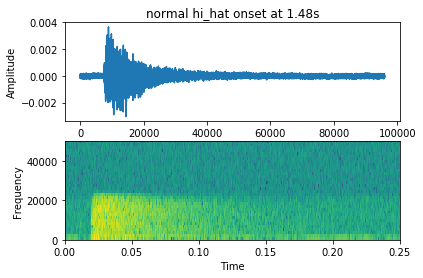

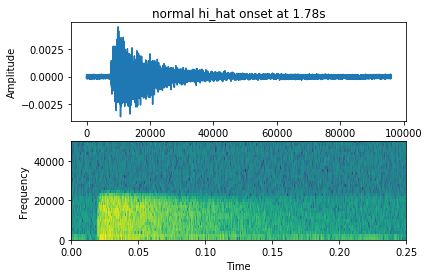

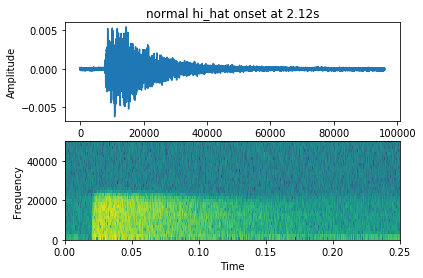

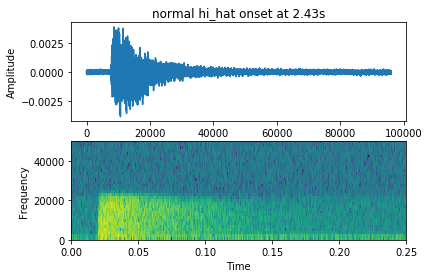

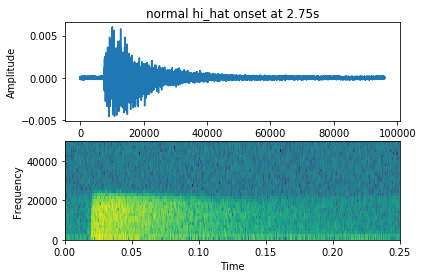

...

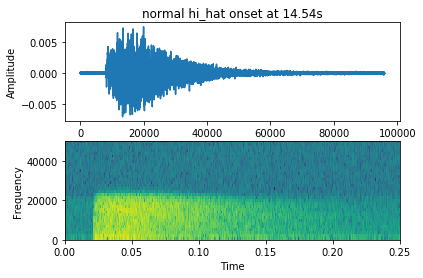

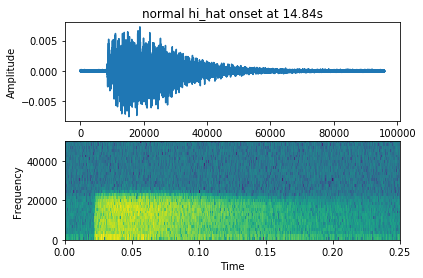

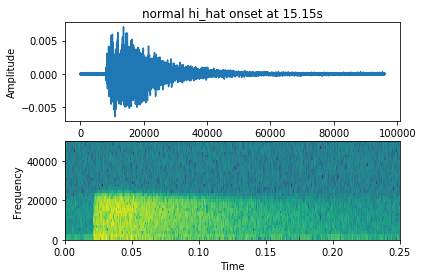

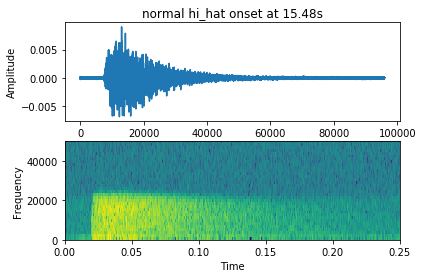

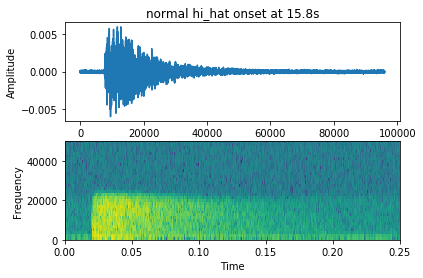

[ 291840  415744 1303808 1430528 1553792 1679744 1804928 1932416 2057344
 2181632 2305536 2432384 2559616 3448704 3576960 4223872 4351616 4485888
 4914304 5317120 5723520 6127232 6522496 6798848 7074304 7335680 7594240
 7867264 8136064]


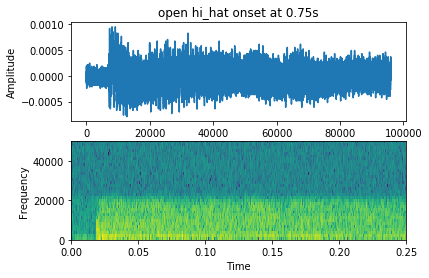

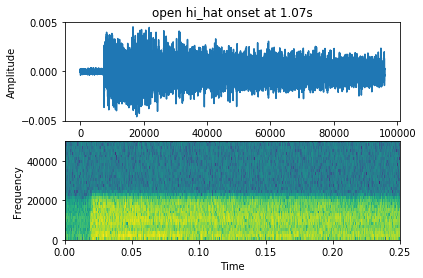

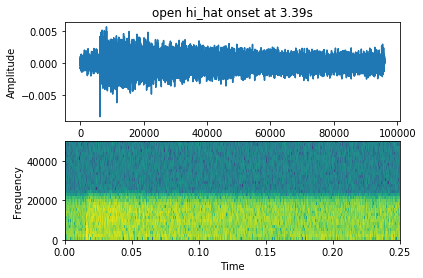

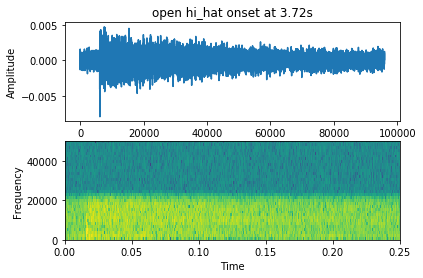

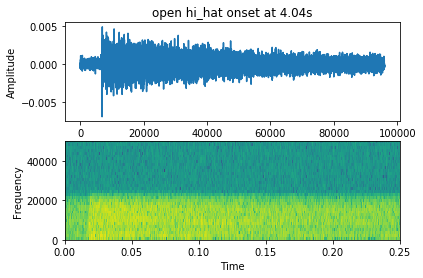

...

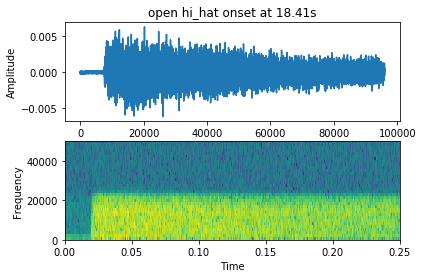

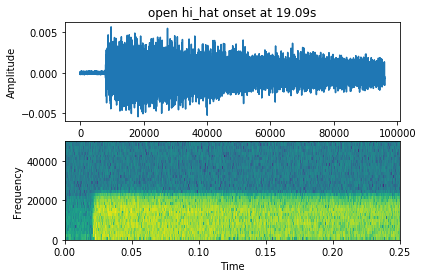

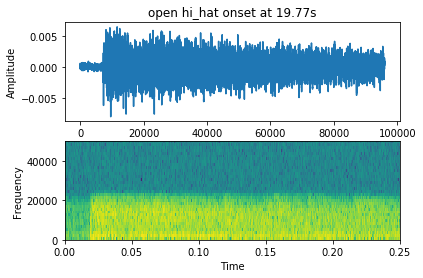

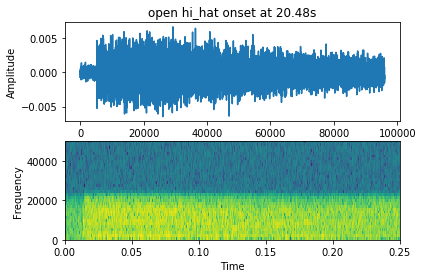

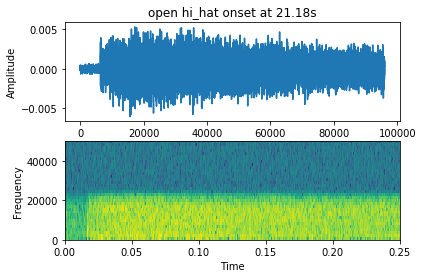

[ 306688  558336  813568 1067264 1317760 1575936 1838464 2085120 2352896
 2599296 2867840 3119104 3370112 3640320 3890560 4145536 4409856 4665344
 4932224 5193472 5456384]


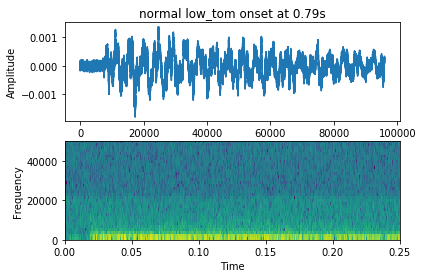

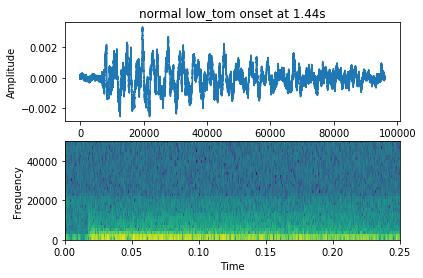

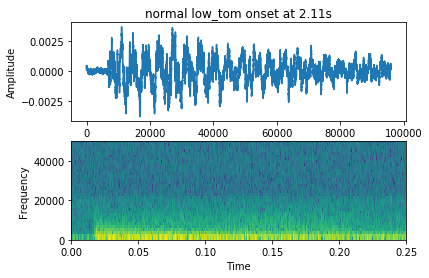

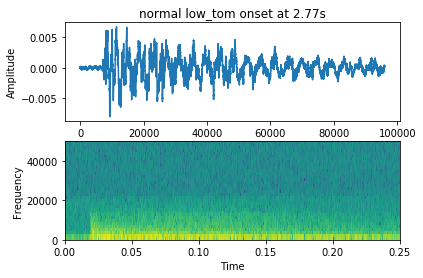

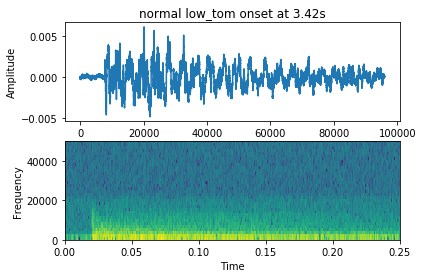

...

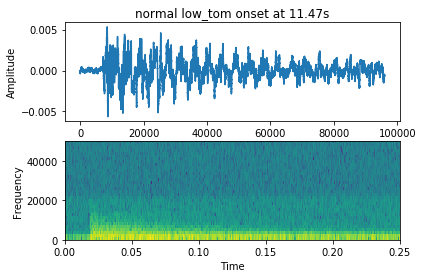

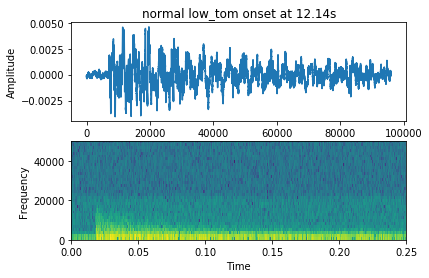

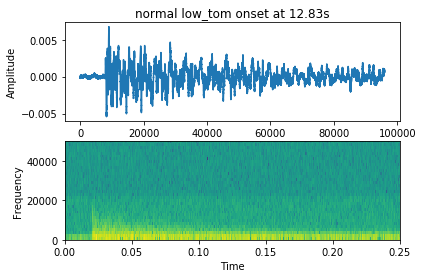

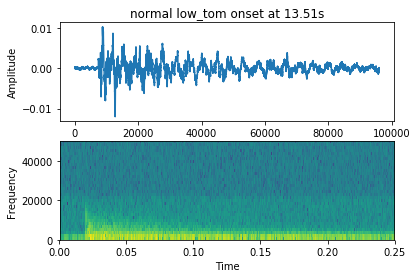

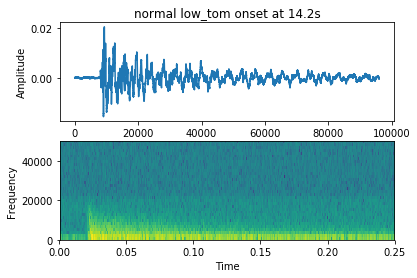

[ 202624  450304  709248  955392 1200640 1456640 1720832 1982208 2239872
 2495616 2763264 3022976 3279360 3537920 3797760 4055936 4330112]


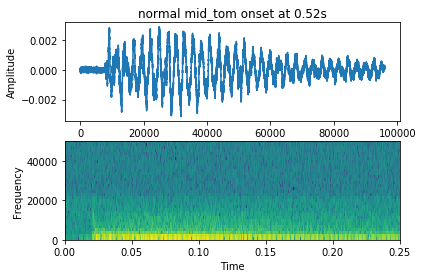

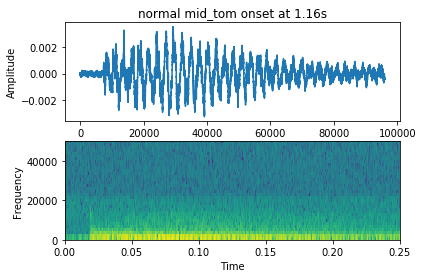

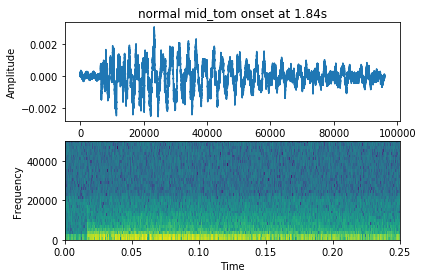

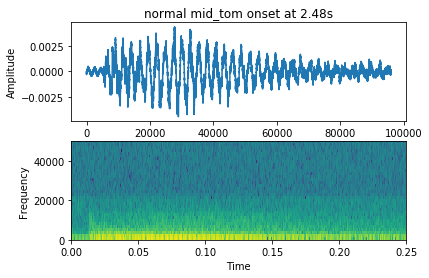

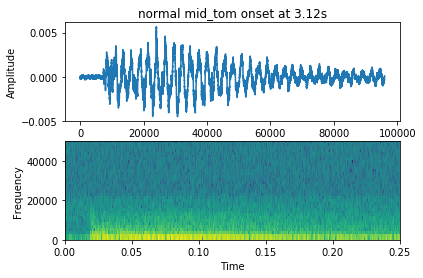

...

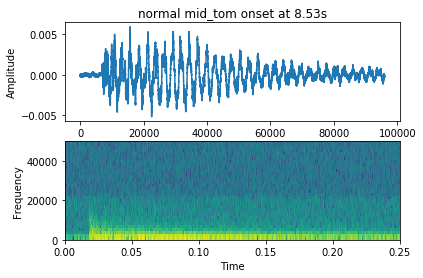

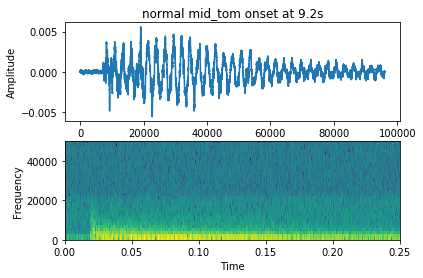

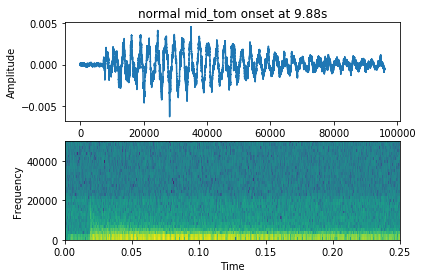

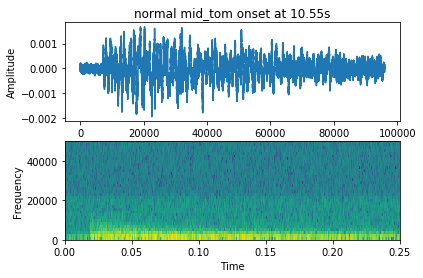

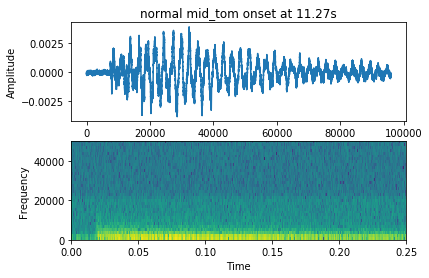

[ 216064  466944  960256 1199872 1435904 1676544 1917056 2855680 3097088
 3327616 3789568 4018816 4252160 4489088 4953600 5187968 5414528]


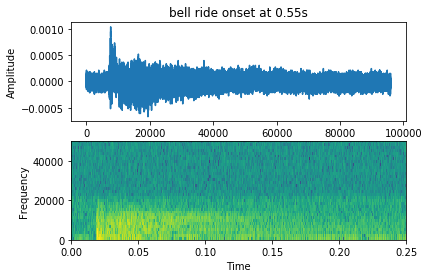

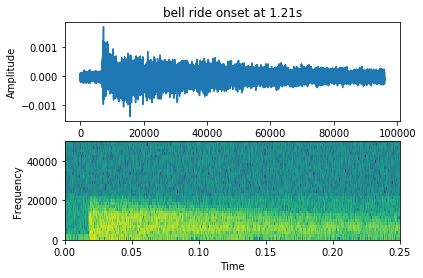

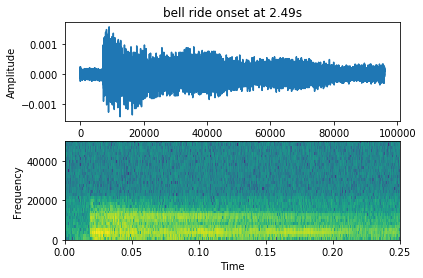

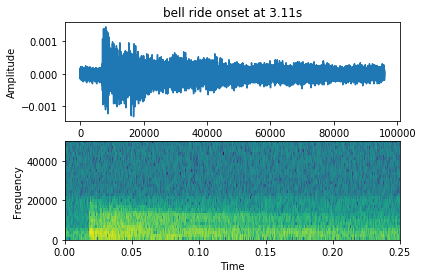

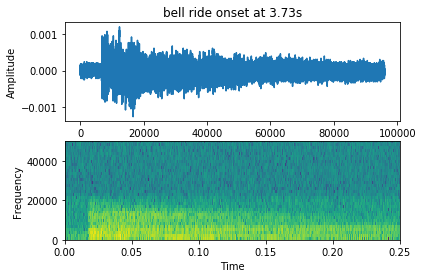

...

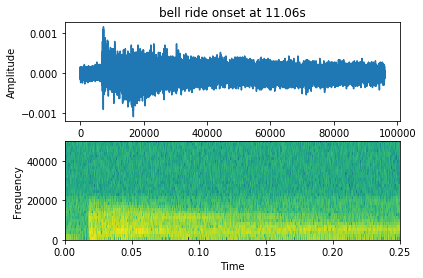

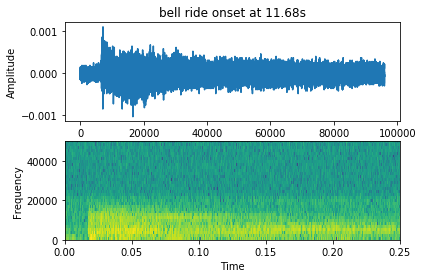

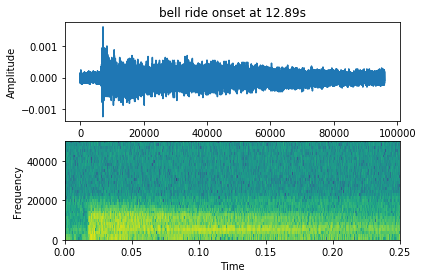

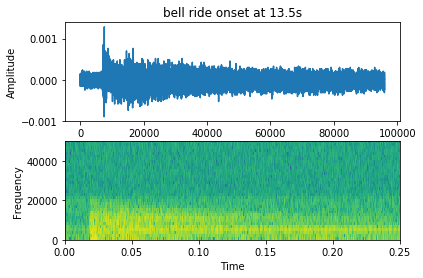

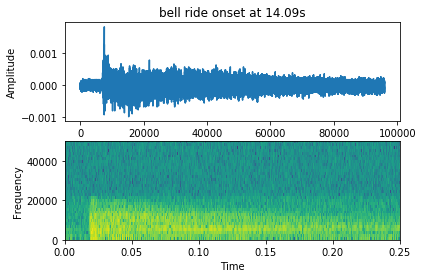

[  450048  1004928  1279488  1561216  1830784  2107648  2625664  3146624
  3664768  3946624  4223616  4792448  5898752  7023616  7294208  7563136
  8365440  9721856 10245760 10503424 10724608]


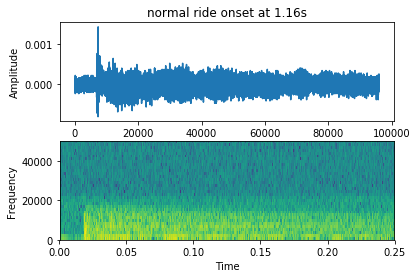

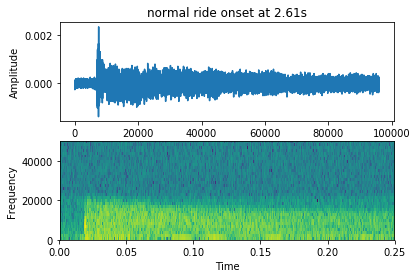

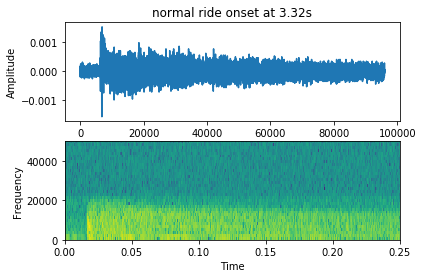

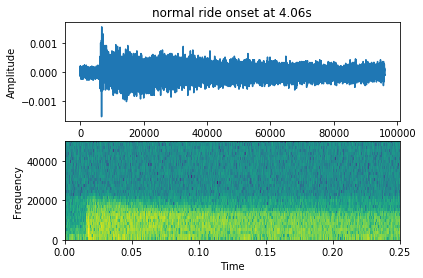

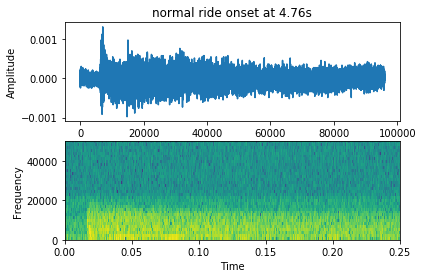

...

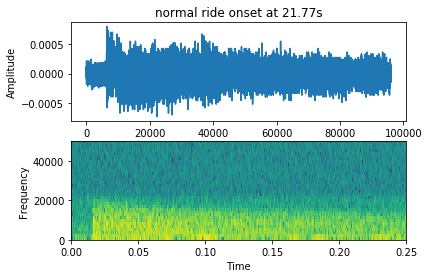

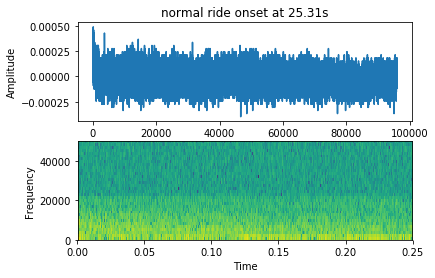

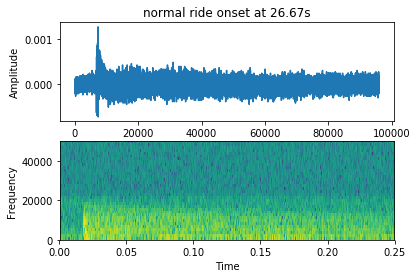

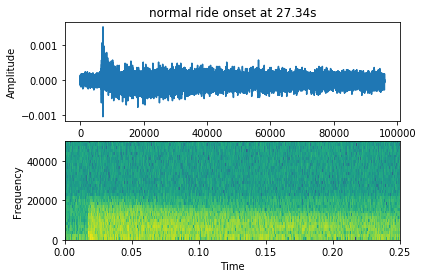

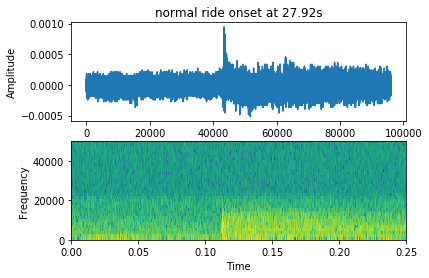

[ 399232  568064  746624  912384 1088000 1265664 1445888 1630592 1817088
 2010624 2194560 2377088 2560384 2746624 2929280 3108864 3284608 3470336
 3658368 3844352 4044288 4249088 4455040 4674048 4902784 5125120 5335936
 5541888 5755008 5976832]


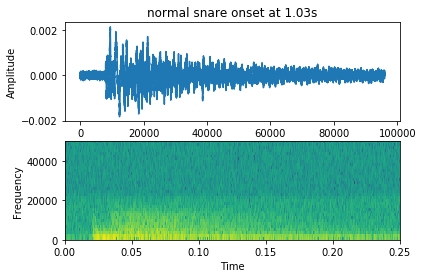

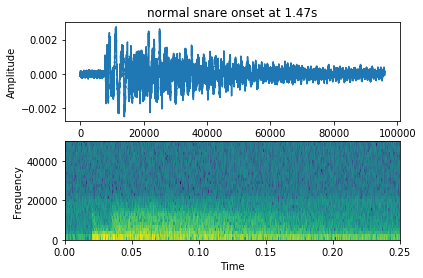

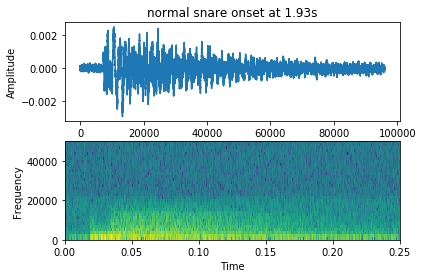

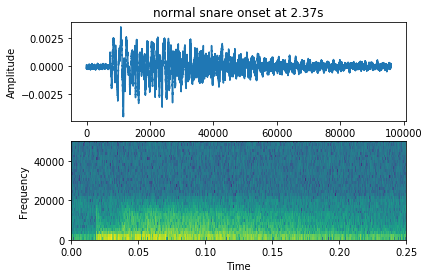

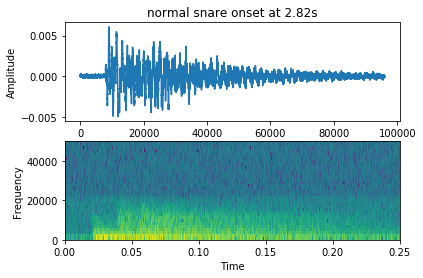

...

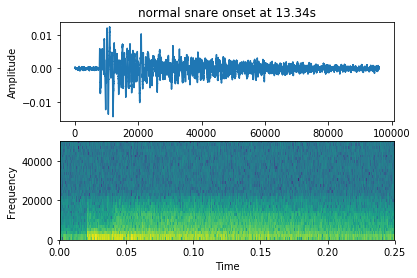

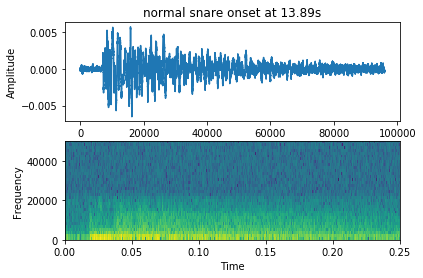

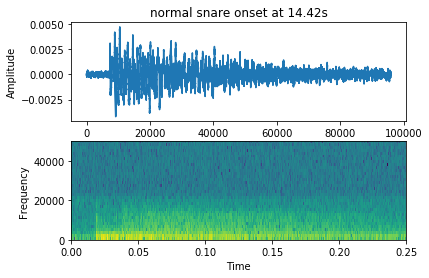

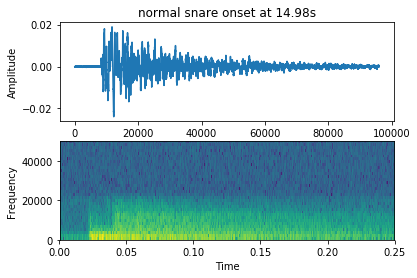

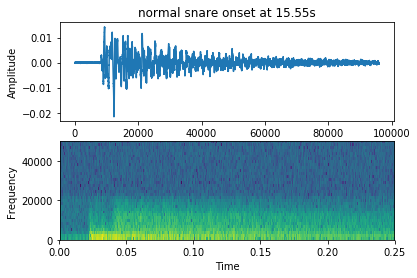

[ 254592  586368  935552 1263488 1597824 1915904 2229760 2887168 3241472
 3578368 3898752 4228992 4560896 4887808]


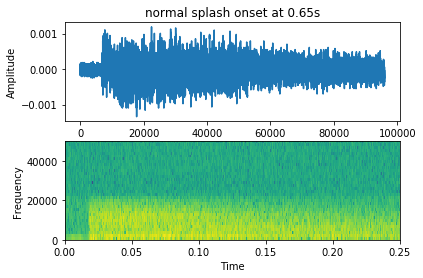

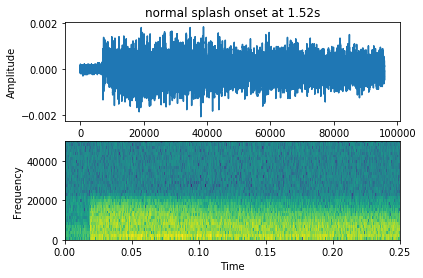

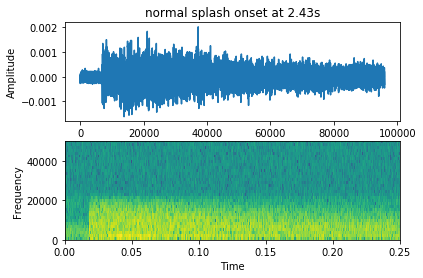

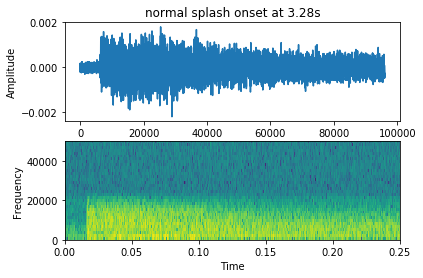

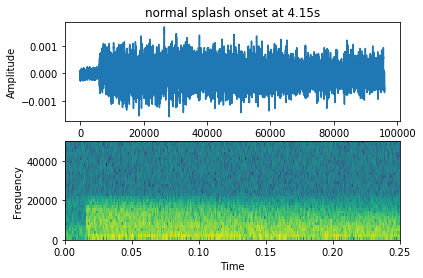

...

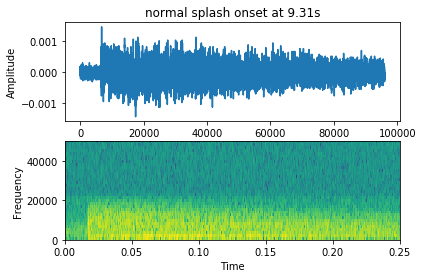

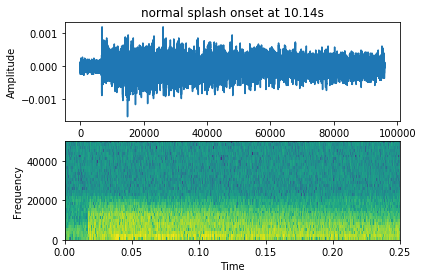

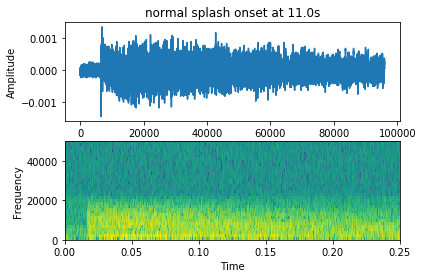

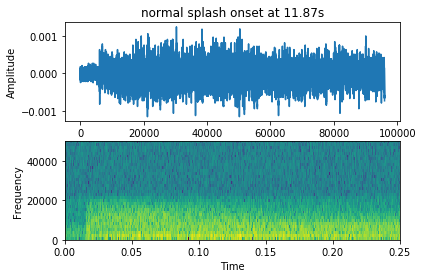

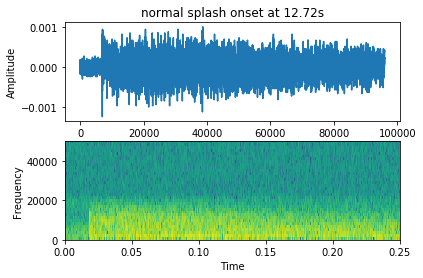

In [39]:
for i in range(len(data_indices)):
    d = sample_data[data_indices[i]]
    labels = d.labels["tech_label"][0] + " " + d.labels["kit_label"][0]
    rd = resampled_data[i]
    onsets = np.array(rd_onsets_c1_1sd[i])
    onsets *= int(d.rate/rd.rate)
    print(onsets)
    for onset in onsets:
        start = int(onset-0.01*d.rate)
        end = int(onset+0.24*d.rate)
        crop = np.array(d.data[start:end])
        t = round(start/data[0].rate, 2)
        plot("{} onset at {}s".format(labels, t), crop, d.rate, (0, 50000))

In [42]:
uni_bd_data, uni_bd_rate = sf.read("D:\\Documents\\University\\Year3\\Independant Studies\\audio_data\\raw_data\\isolated_hits\\uni_kit\\beater\\bass_drum\\normal\\0.wav", dtype="float32")

In [44]:
ebn_uni_bd = energy_based_novelty(uni_bd_data, 300)
ebn_tf_uni_bd = threshold_func(ebn_uni_bd, int(SETTINGS.data["cropped"]["down_sampling_rate"]/5), stats.stdev(ebn_uni_bd.tolist()), 5)

NameError: name 'ebn' is not defined

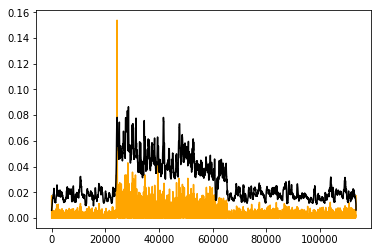

[24367]


In [45]:
uni_bd_onsets = onset_detection(ebn_uni_bd, ebn_tf_uni_bd, trim=100)
plt.plot(ebn_uni_bd, color="orange", label="EBN")
plt.plot(ebn_tf_uni_bd, color="black", label="TF")
plt.show()
print(uni_bd_onsets)

In [46]:
data = []
while (True):
    samples = read_data("raw", batch_index=i, batch_size=10, True)
    if sample
    data.append(samples)

SyntaxError: invalid syntax (<ipython-input-46-ee657c74665e>, line 2)